In [42]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from scipy import linalg
from scipy.spatial.distance import cdist
from scipy.ndimage import gaussian_filter, convolve
import os
from PIL import Image
import math
import harris
from skimage.color import rgb2gray


A.2: Recover Homographies

C:\Users\isabe\AppData\Local\Temp\ipykernel_23116\3819927309.py:12: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


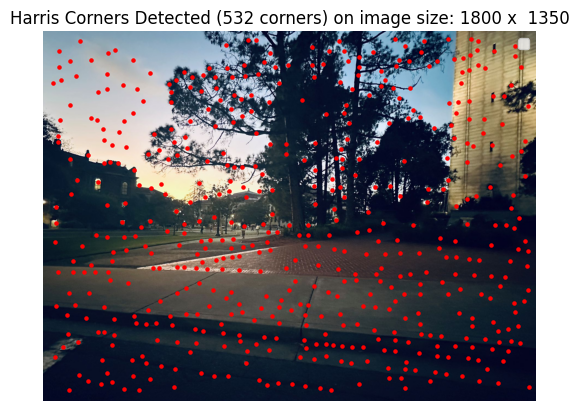

In [50]:
img = plt.imread("../data/IMG_8863r.jpg")
img_gray = rgb2gray(img)
img_gray = gaussian_filter(img_gray, sigma=10)
h, coord = harris.get_harris_corners(img_gray)
fig, ax = plt.subplots()

# Plot the image
ax.imshow(img)
ax.scatter(coord[1, :], coord[0, :], c='r', s=5)
ax.set_title(f"Harris Corners Detected ({len(coord[1, :])} corners) on image size: {len(img_gray[0])} x  {len(img_gray)}")

ax.legend()
ax.axis('off')
plt.show()

In [4]:
#go over all the point, find h's thats stronger then curr point i and 
# set i's r to the min distance between i and the next stronger point

#h_value is the coord's map to h value, a N array 
def anms(h_value, coord, num_points, c_robust = 0.4): 
    n = len(coord[0])
    print(f"n:{n}")
    r_value = np.zeros(n) #we only care strongest r so default is 0
    
    coord_t = coord.T
    for i in range(n): 
        stronger_pts = h_value > (h_value[i] / c_robust)
        #print(f"stronger_pts:{stronger_pts.shape}")
        if len(stronger_pts) != len(coord_t):
            print(f"Size mismatch: stronger_pts {len(stronger_pts)} vs coord_t {len(coord_t)}")
        if stronger_pts.any(): 
            all_dist = harris.dist2(coord_t[i].reshape(1, 2), coord_t[stronger_pts])
            print(f"{coord_t[i].reshape(1, 2)}")
            min_r = np.min(all_dist)
            r_value[i] = min_r
        else: 
            r_value[i] = np.inf
        
    selected_indices = np.argsort(-r_value)[:num_points]
    
    return coord[:, selected_indices], r_value[selected_indices]

size h(60,)
size coord(2, 60)
n:60
[[183 264]]
[[260 456]]
[[239 209]]
[[226 282]]
[[154 219]]
[[230 259]]
[[210  81]]
[[197 430]]
[[197 472]]
[[294 303]]
[[269 267]]
[[299 445]]
[[288  37]]
[[170 156]]
[[241 343]]
[[220  27]]
[[294 349]]
[[300 374]]
[[273  95]]
[[ 44 348]]
[[350 446]]
[[ 97 265]]
[[353  95]]
[[311 248]]
[[ 55 440]]
[[126 461]]
[[328 287]]
[[ 32 249]]
[[335 191]]
[[136 192]]
[[347 232]]
[[303 176]]
[[57 28]]
[[ 88 176]]
[[295 201]]
[[321 136]]
[[102 223]]
[[ 48 208]]
[[ 47 167]]
[[ 56 144]]
[[23 64]]
[[ 23 104]]
[[ 23 135]]
[[ 61 111]]


C:\Users\isabe\AppData\Local\Temp\ipykernel_23116\2919812745.py:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


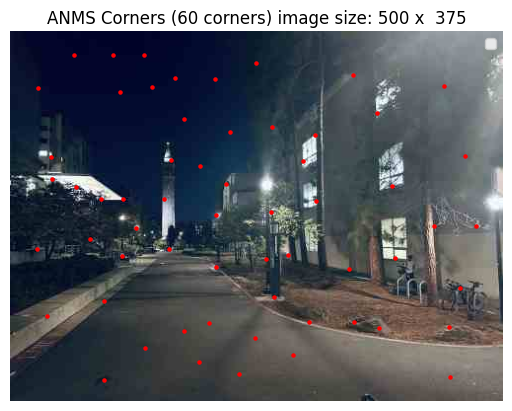

In [5]:
img = plt.imread("../data/IMG_8851r.jpg")
img_gray = rgb2gray(img)
h, coord = harris.get_harris_corners(img_gray)
h_array =  h[coord[0, :].astype(int), coord[1, :].astype(int)] 
print(f"size h{h_array.shape}")
print(f"size coord{coord.shape}")

coord_anms, r_value= anms(h_array, coord, 500)

fig, ax = plt.subplots()

# Plot the image
ax.imshow(img)
ax.scatter(coord_anms[1, :], coord_anms[0, :], c='r', s=5)
ax.set_title(f"ANMS Corners ({len(coord_anms[0, :])} corners) image size: {len(img_gray[0])} x  {len(img_gray)}")

ax.legend()
ax.axis('off')
plt.show()



In [6]:
from scipy.ndimage import gaussian_filter

def extract_descirptor(img_gray, coord, patch_size=8, sample_spacing=5): 
    blurred = gaussian_filter(img_gray, sigma=2.0)
    descriptor = []
    valid_corner = []
    half_window = (patch_size * sample_spacing) // 2

    for i in range(coord.shape[1]):
        y, x = coord[0, i], coord[1, i]

        if (y - half_window < 0 or y + half_window >= img_gray.shape[0] or
            x - half_window < 0 or x + half_window >= img_gray.shape[1]):
            continue
        patch = np.zeros((patch_size, patch_size))
        for dy in range(patch_size): 
            for dx in range(patch_size): 
                y_sample = y + (dy - patch_size//2) * sample_spacing
                x_sample = x + (dx - patch_size//2) * sample_spacing
                patch[dy, dx] = blurred[int(y_sample), int(x_sample)]
                
        
        patch = (patch - np.mean(patch)) / (np.std(patch) + 1e-8)
        descriptor.append(patch.flatten())
        valid_corner.append(i) 
    return np.array(descriptor), coord[:, valid_corner]


size h(60,)
size coord(2, 60)
n:60
[[183 264]]
[[260 456]]
[[239 209]]
[[226 282]]
[[154 219]]
[[230 259]]
[[210  81]]
[[197 430]]
[[197 472]]
[[294 303]]
[[269 267]]
[[299 445]]
[[288  37]]
[[170 156]]
[[241 343]]
[[220  27]]
[[294 349]]
[[300 374]]
[[273  95]]
[[ 44 348]]
[[350 446]]
[[ 97 265]]
[[353  95]]
[[311 248]]
[[ 55 440]]
[[126 461]]
[[328 287]]
[[ 32 249]]
[[335 191]]
[[136 192]]
[[347 232]]
[[303 176]]
[[57 28]]
[[ 88 176]]
[[295 201]]
[[321 136]]
[[102 223]]
[[ 48 208]]
[[ 47 167]]
[[ 56 144]]
[[23 64]]
[[ 23 104]]
[[ 23 135]]
[[ 61 111]]


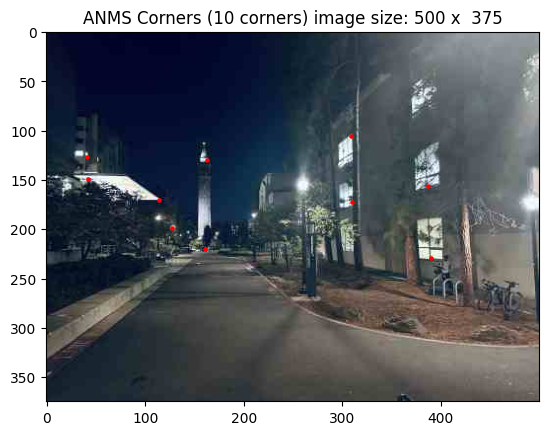

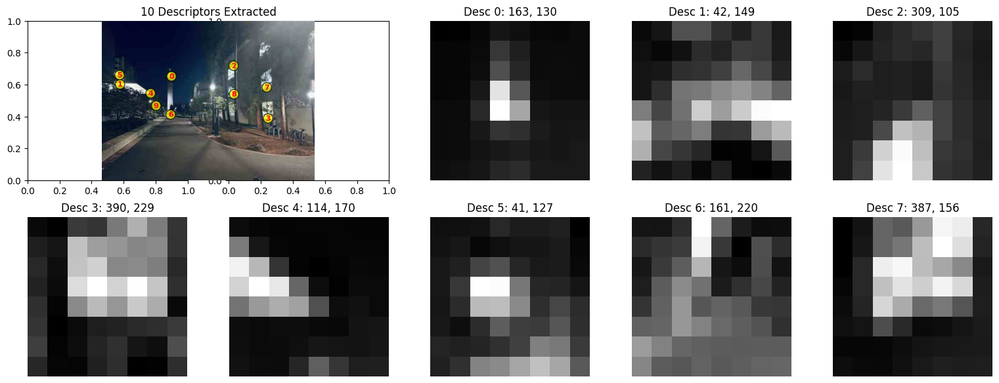

In [7]:
img = plt.imread("../data/IMG_8851r.jpg")
img_gray = rgb2gray(img)
h, coord = harris.get_harris_corners(img_gray)
h_array =  h[coord[0, :].astype(int), coord[1, :].astype(int)] 
print(f"size h{h_array.shape}")
print(f"size coord{coord.shape}")

coord_anms, r_value= anms(h_array, coord, 10)
descriptors, valid_coords = extract_descirptor(img_gray, coord_anms)

fig, ax = plt.subplots()

ax.imshow(img)
ax.scatter(coord_anms[1, :], coord_anms[0, :], c='r', s=5)
ax.set_title(f"ANMS Corners ({len(coord_anms[0, :])} corners) image size: {len(img_gray[0])} x  {len(img_gray)}")

fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.ravel()

ax_main = plt.subplot2grid((2, 5), (0, 0), colspan=2)
ax_main.imshow(img)
for i in range(min(20, valid_coords.shape[1])): 
    x, y = valid_coords[1, i], valid_coords[0, i]
    ax_main.text(x, y, str(i), color='red', fontsize=8, 
                 ha='center', va='center', weight='bold',
                 bbox=dict(boxstyle="circle,pad=0.2", facecolor='yellow', alpha=0.7))

ax_main.set_title(f"{len(descriptors)} Descriptors Extracted")
ax_main.axis('off')

for i in range(8):
    if i < len(descriptors):
        patch = descriptors[i].reshape(8, 8)
        axes[i+2].imshow(patch, cmap='gray')
        axes[i+2].set_title(f'Desc {i}: {valid_coords[1, i]}, {valid_coords[0, i]}')
        axes[i+2].axis('off')
    else:
        axes[i+2].axis('off')

plt.tight_layout()
plt.show()

n:985
[[ 133 1190]]
[[181 350]]
[[582 700]]
[[ 458 1196]]
[[329 535]]
[[ 332 1530]]
[[586 659]]
[[ 303 1239]]
[[ 739 1244]]
[[275  96]]
[[ 470 1673]]
[[ 596 1733]]
[[494 246]]
[[526 413]]
[[ 129 1051]]
[[ 708 1075]]
[[340  43]]
[[312 244]]
[[ 410 1224]]
[[ 529 1167]]
[[656 764]]
[[ 318 1634]]
[[  66 1010]]
[[709 904]]
[[ 356 1690]]
[[ 252 1224]]
[[ 335 1166]]
[[151 317]]
[[ 411 1143]]
[[357 119]]
[[  35 1019]]
[[ 291 1523]]
[[235 467]]
[[ 395 1516]]
[[ 259 1545]]
[[ 695 1561]]
[[ 332 1560]]
[[ 720 1050]]
[[  84 1134]]
[[207 938]]
[[154 378]]
[[177 198]]
[[848 810]]
[[  26 1065]]
[[325 294]]
[[598 830]]
[[119 305]]
[[177 234]]
[[  51 1461]]
[[ 396 1682]]
[[  91 1040]]
[[867 951]]
[[ 369 1720]]
[[317 319]]
[[658 577]]
[[ 116 1139]]
[[ 731 1278]]
[[  73 1223]]
[[  70 1295]]
[[ 227 1493]]
[[ 454 1358]]
[[ 422 1006]]
[[  98 1219]]
[[ 746 1045]]
[[  65 1058]]
[[ 372 1532]]
[[ 720 1455]]
[[ 186 1648]]
[[ 298 1770]]
[[842 875]]
[[279 883]]
[[699 825]]
[[ 162 1594]]
[[ 195 1592]]
[[ 235 1631]]


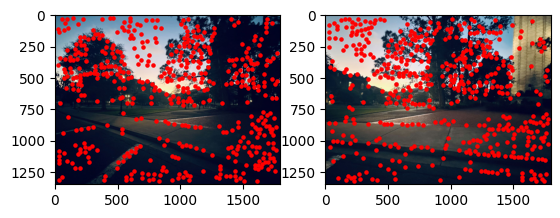

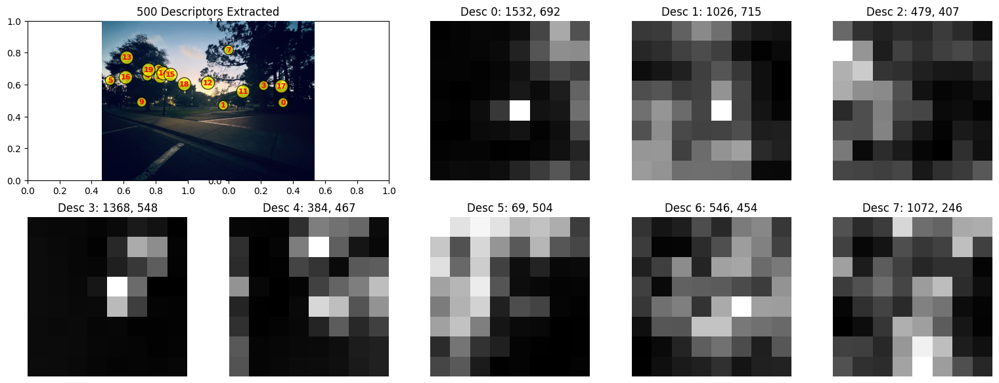

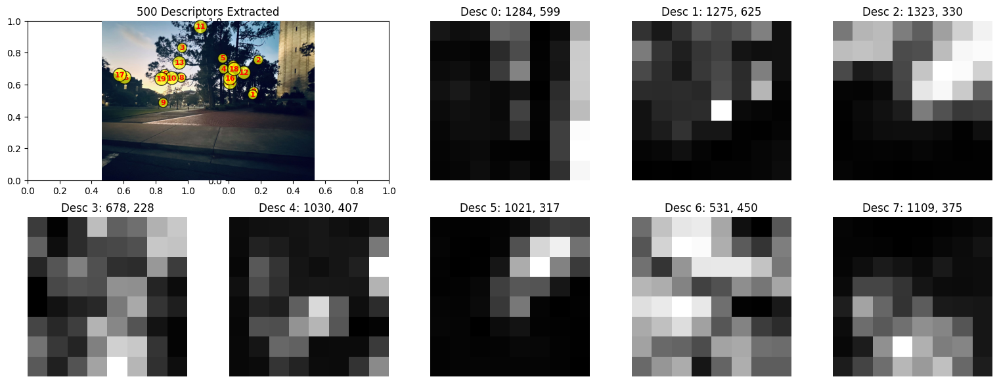

In [15]:
img1 = plt.imread("../data/IMG_8862r.jpg")
img2 = plt.imread("../data/IMG_8863r.jpg")

img_gray1 = rgb2gray(img1)
h1, coord1 = harris.get_harris_corners(img_gray1)
h_array1 =  h1[coord1[0, :].astype(int), coord1[1, :].astype(int)] 

img_gray2 = rgb2gray(img2)
h2, coord2 = harris.get_harris_corners(img_gray2)
h_array2 =  h2[coord2[0, :].astype(int), coord2[1, :].astype(int)] 

coord_anms1, r_value1= anms(h_array1, coord1, 500)
descriptors1, valid_coords1 = extract_descirptor(img_gray1, coord_anms1)

coord_anms2, r_value2= anms(h_array2, coord2, 500)
descriptors2, valid_coords2 = extract_descirptor(img_gray2, coord_anms2)

fig, ax = plt.subplots(1, 2)

ax[0].imshow(img1)
ax[1].imshow(img2)
ax[0].scatter(coord_anms1[1, :], coord_anms1[0, :], c='r', s=5)

ax[1].scatter(coord_anms2[1, :], coord_anms2[0, :], c='r', s=5)
#ax[0].set_title(f"ANMS Corners ({len(coord_anms2[0, :])} corners) image size: {len(img_gray2[0])} x  {len(img_gray2)}")

def display_features(img, valid_coords, descriptors): 

    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    axes = axes.ravel()

    ax_main = plt.subplot2grid((2, 5), (0, 0), colspan=2)
    ax_main.imshow(img)
    for i in range(min(20, valid_coords.shape[1])): 
        x, y = valid_coords[1, i], valid_coords[0, i]
        ax_main.text(x, y, str(i), color='red', fontsize=8, 
                    ha='center', va='center', weight='bold',
                    bbox=dict(boxstyle="circle,pad=0.2", facecolor='yellow', alpha=0.7))

    ax_main.set_title(f"{len(descriptors)} Descriptors Extracted")
    ax_main.axis('off')

    for i in range(8):
        if i < len(descriptors):
            patch = descriptors[i].reshape(8, 8)
            axes[i+2].imshow(patch, cmap='gray')
            axes[i+2].set_title(f'Desc {i}: {valid_coords[1, i]}, {valid_coords[0, i]}')
            axes[i+2].axis('off')
        else:
            axes[i+2].axis('off')

    plt.tight_layout()
    plt.show()


display_features(img1, valid_coords1, descriptors1)
display_features(img2, valid_coords2, descriptors2)


In [16]:
from sklearn.neighbors import NearestNeighbors

def feature_matching(descriptors_1, valid_coords_1, descriptors_2, valid_coords_2, threshold=0.8): 
    
    nbrs = NearestNeighbors(n_neighbors=2).fit(descriptors_2)
    distances, indices = nbrs.kneighbors(descriptors_1)

    ratios = distances[:, 0] / distances[:, 1]
    good_matches_mask = ratios < threshold

    good_match_indices_1 = np.where(good_matches_mask)[0] 
    good_match_indices_2 = indices[good_matches_mask, 0] 
        
    matched_coords_1 = valid_coords_1[:, good_match_indices_1]
    matched_coords_2 = valid_coords_2[:, good_match_indices_2]
    matched_descriptors_1 = descriptors_1[good_match_indices_1]
    matched_descriptors_2 = descriptors_2[good_match_indices_2]

    return (matched_coords_1, matched_coords_2, 
            matched_descriptors_1, matched_descriptors_2)

des shape[[-0.02757975 -0.62803632 -0.34957986 ...  1.15932644 -0.06789029
  -0.68638864]
 [ 1.53861338  1.53501405  1.52960157 ... -1.04024596 -0.96562765
  -0.7830221 ]
 [ 0.82608141 -0.15968008 -0.693905   ... -1.28685777 -1.37280494
  -1.35889831]
 ...
 [-0.02492203 -0.1224009   0.03522368 ... -1.08442409 -1.12992794
  -1.13264134]
 [-0.76104186 -0.78451858 -0.81035427 ...  1.0198435   1.37741138
   1.29958539]
 [ 0.79435503  0.53107301  0.56692291 ...  0.4059307   0.5006841
   0.42215618]]


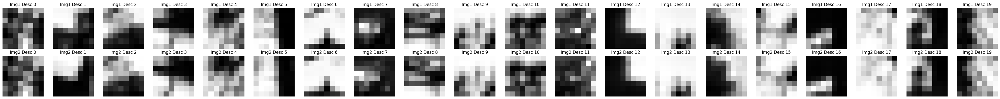

Displayed 20 descriptor pairs. Total pairs: 41


In [17]:
def display_paired_descriptors(descriptors1, descriptors2, num_pairs=8):
    fig, axes = plt.subplots(2, num_pairs, figsize=(2*num_pairs, 4))
    if num_pairs == 1:
        axes = axes.reshape(2, 1)
    for i in range(min(num_pairs, len(descriptors1))):
        patch1 = descriptors1[i].reshape(8, 8)
        axes[0, i].imshow(patch1, cmap='gray')
        axes[0, i].set_title(f'Img1 Desc {i}')
        axes[0, i].axis('off')

        patch2 = descriptors2[i].reshape(8, 8)
        axes[1, i].imshow(patch2, cmap='gray')
        axes[1, i].set_title(f'Img2 Desc {i}')
        axes[1, i].axis('off')
    plt.tight_layout()
    plt.show()
    print(f"Displayed {min(num_pairs, len(descriptors1))} descriptor pairs. Total pairs: {len(descriptors1)}")



valid_coords1f, valid_coords2f, descriptors1f, descriptors2f,= feature_matching(
    descriptors1, valid_coords1, 
    descriptors2, valid_coords2, 
    threshold=0.7
)
print(f"des shape{descriptors1f}")
display_paired_descriptors(descriptors1f, descriptors2f, num_pairs=min(20, len(descriptors1f)))




In [18]:
def computeH(im1_pts, im2_pts):
    
    im1_pts = np.array(im1_pts)
    im2_pts = np.array(im2_pts)
    n = im1_pts.shape[0]
    
    if n < 4:
        raise ValueError("At least 4 point correspondences are required")
    
    A = []
    b = []
    
    for i in range(n):
        x, y = im1_pts[i]
        xp, yp = im2_pts[i]
        
        A.append([x, y, 1, 0, 0, 0, -xp*x, -xp*y])
        b.append(xp)
        A.append([0, 0, 0, x, y, 1, -yp*x, -yp*y])
        b.append(yp)
    
    A = np.array(A)
    b = np.array(b)
    
    if A.shape[0] == A.shape[1]:  
        h = np.linalg.solve(A, b)
    else: 
        h = np.linalg.lstsq(A, b, rcond=None)[0]
    
    H = np.array([
        [h[0], h[1], h[2]],   
        [h[3], h[4], h[5]],    
        [h[6], h[7], 1.0]     
    ])
    
    return H

def apply_homography(pts, H): 
    ones = np.ones((pts.shape[0],1))
    pts_homo = np.hstack([pts, ones])

    transformed_homo = pts_homo @ H.T
    transformed = transformed_homo[:, :2] / transformed_homo[:, 2:3]
    return transformed

In [19]:
def ransac(src_pts, des_point, num_iter = 1000, inlier_threshold= 10): 
    src_pts = np.flipud(src_pts).T  
    des_point = np.flipud(des_point).T
    best_inlier = 0
    best_error = np.inf
    best_inlier_mask = None

    for i in range(num_iter): 
        if src_pts.shape[1] >= 4: 
            idx = np.random.choice(src_pts.shape[1], 4, replace=False)
        else: 
            print(f"have {src_pts.shape} points")
            idx= np.arange(src_pts.shape[1])
            
        print(f"idx:{idx}")
        src_sample = src_pts[:, idx]
        des_sample = des_point[:, idx]
        H = computeH(src_sample, des_sample)

        src_transformed = apply_homography(src_pts, H)
        errors = np.linalg.norm(src_transformed - des_point, axis=1)

        inlier_mask = errors < inlier_threshold 
        num_inliers = np.sum(inlier_mask)
        avg_error = np.mean(errors[inlier_mask]) if num_inliers > 0 else float('inf')


        if (num_inliers > best_inlier) or (num_inliers == best_inlier and avg_error < best_error): 
            best_inlier = num_inliers
            best_error = avg_error
            best_inlier_mask = inlier_mask

    src_inliers = src_pts[best_inlier_mask]
    dest_inliers = des_point[best_inlier_mask]
    print(f"src and dest inliners{src_inliers, dest_inliers}")

    recomputed_H = computeH(src_inliers, dest_inliers)

    return recomputed_H, best_inlier, best_error, best_inlier_mask


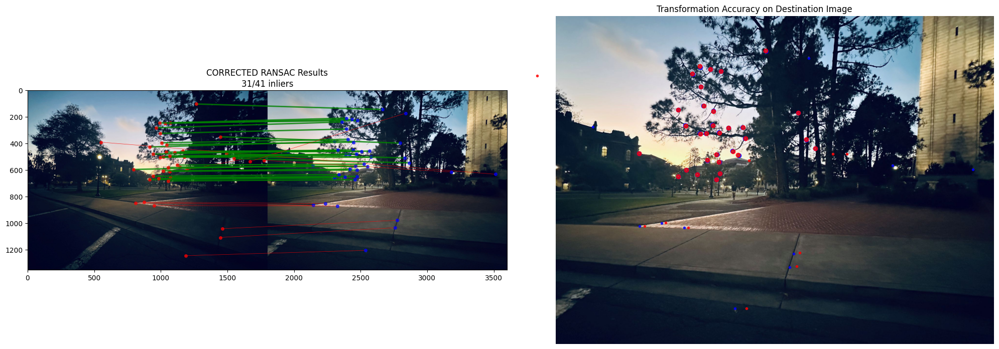

Inliers: 31/41
Average error: 1.51 pixels


In [ ]:
def ransac_corrected(src_pts, dst_pts, num_iter=1000, inlier_threshold=10): 
    
    # Convert from [y, x] to [x, y] format
    src_pts_xy = np.flipud(src_pts).T  # (N, 2) [x, y]
    dst_pts_xy = np.flipud(dst_pts).T  # (N, 2) [x, y]
    
    best_inlier = 0
    best_error = np.inf
    best_H = None
    best_inlier_mask = None
    
    for i in range(num_iter): 
        if src_pts_xy.shape[0] >= 4: 
            idx = np.random.choice(src_pts_xy.shape[0], 4, replace=False)
        else: 
            idx = np.arange(src_pts_xy.shape[0])
            
        src_sample = src_pts_xy[idx]  # (4, 2) [x, y]
        dst_sample = dst_pts_xy[idx]  # (4, 2) [x, y]
        
        try:
            H = computeH(src_sample, dst_sample)
            
            src_transformed = apply_homography(src_pts_xy, H)
            errors = np.linalg.norm(src_transformed - dst_pts_xy, axis=1)

            inlier_mask = errors < inlier_threshold 
            num_inliers = np.sum(inlier_mask)
            avg_error = np.mean(errors[inlier_mask]) if num_inliers > 0 else float('inf')

            if (num_inliers > best_inlier) or (num_inliers == best_inlier and avg_error < best_error): 
                best_inlier = num_inliers
                best_error = avg_error
                best_H = H
                best_inlier_mask = inlier_mask
                
        except Exception as e:
            continue

    return best_H, best_inlier, best_error, best_inlier_mask

def visualize_ransac_corrected(img1, img2, src_pts, dst_pts, H, inlier_mask, title="RANSAC Results"):
    """
    CORRECTED: Proper coordinate handling throughout
    """
    # Convert from [y, x] to [x, y] format
    src_pts_xy = np.flipud(src_pts).T  # (N, 2) [x, y]
    dst_pts_xy = np.flipud(dst_pts).T  # (N, 2) [x, y]
    
    # Transform source points
    src_transformed = apply_homography(src_pts_xy, H)
    
    # Create composite image
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    composite = np.zeros((max(h1, h2), w1 + w2, 3))
    composite[:h1, :w1] = img1
    composite[:h2, w1:w1+w2] = img2
    
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))
    
    # Plot 1: Show matches with inliers/outliers
    axes[0].imshow(composite.astype(int))
    axes[0].set_title(f'{title}\n{np.sum(inlier_mask)}/{len(inlier_mask)} inliers')
    
    # Draw lines and points using [x, y] format
    for i in range(len(src_pts_xy)):
        x1, y1 = src_pts_xy[i]  # [x, y] from Image 1
        x2, y2 = dst_pts_xy[i]  # [x, y] from Image 2  
        x2 += w1  # Offset for second image
        
        color = 'green' if inlier_mask[i] else 'red'
        linewidth = 2 if inlier_mask[i] else 0.5
        
        axes[0].plot([x1, x2], [y1, y2], color=color, linewidth=linewidth, alpha=0.8)
        axes[0].plot(x1, y1, 'ro', markersize=4, alpha=0.7)
        axes[0].plot(x2, y2, 'bo', markersize=4, alpha=0.7)
    
    # Plot 2: Show transformation accuracy
    axes[1].imshow(img2)
    axes[1].set_title('Transformation Accuracy on Destination Image')
    
    for i in range(len(dst_pts_xy)):
        x_dst, y_dst = dst_pts_xy[i]  # [x, y]
        x_trans, y_trans = src_transformed[i]  # [x, y]
        
        color = 'green' if inlier_mask[i] else 'red'
        marker_size = 6 if inlier_mask[i] else 3
        
        axes[1].plot(x_dst, y_dst, 'bo', markersize=marker_size, alpha=0.8)
        axes[1].plot(x_trans, y_trans, 'ro', markersize=marker_size, alpha=0.8)
        
        if inlier_mask[i]:
            axes[1].plot([x_dst, x_trans], [y_dst, y_trans], 'y-', linewidth=1, alpha=0.5)
    
    axes[1].axis('off')
    plt.tight_layout()
    plt.show()
    
    # Print correct statistics
    errors = np.linalg.norm(src_transformed - dst_pts_xy, axis=1)
    print(f"Inliers: {np.sum(inlier_mask)}/{len(inlier_mask)}")
    print(f"Average error: {np.mean(errors[inlier_mask]):.2f} pixels")

# Use the corrected functions
H_corrected, num_inliers_corrected, error_corrected, inlier_mask_corrected = ransac_corrected(
    valid_coords1f, valid_coords2f, 
    num_iter=1000, inlier_threshold=5.0
)

visualize_ransac_corrected(
    img1, img2, 
    valid_coords1f, valid_coords2f, 
    H_corrected, inlier_mask_corrected,
    title="CORRECTED RANSAC Results"
)

In [21]:

def nearest_neighbor_interp(im, x, y): 
    h, w = im.shape[:2]

    x_round = np.round(x).astype(int)
    y_round = np.round(y).astype(int)

    x_round = np.clip(x_round, 0, w-1)
    y_round = np.clip(y_round, 0, h-1)

    return im[y_round, x_round]

def bilinear_interp(im, x, y): 
    h, w = im.shape[:2]

    x0 = np.floor(x).astype(int)
    x1 = x0 + 1 
    y0 = np.floor(y).astype(int)
    y1 = y0 + 1

    x0 = np.clip(x0, 0, w-1)
    x1 = np.clip(x1, 0, w-1)
    y0 = np.clip(y0, 0, h-1)
    y1 = np.clip(y1, 0, h-1)

    wa = (x1 - x) * (y1 - y)
    wb = (x1 - x) * (y - y0)
    wc = (x - x0) * (y1 - y)
    wd = (x - x0) * (y - y0)

    if len(im.shape) == 3:  #add None to prevent shape mismatch
        interpolated = (wa[:, :, None] * im[y0, x0] +
                       wb[:, :, None] * im[y1, x0] +
                       wc[:, :, None] * im[y0, x1] +
                       wd[:, :, None] * im[y1, x1])
    else: 
        interpolated = (wa * im[y0, x0] +
                       wb * im[y1, x0] +
                       wc * im[y0, x1] +
                       wd * im[y1, x1])
        
    return interpolated.astype(im.dtype)

In [22]:
def get_output_size(im, H):
    """Debug the output size calculation"""
    h, w = im.shape[:2]
    
    # Get the four corners of the image
    corners = np.array([[0, 0], [w-1, 0], [w-1, h-1], [0, h-1]], dtype=np.float32)
    corners_homo = np.column_stack([corners, np.ones(4)])
    
    # Transform corners using homography
    transformed_corners = (H @ corners_homo.T).T
    transformed_corners = transformed_corners[:, :2] / transformed_corners[:, 2:3]
    
    print("Original corners:")
    print(corners)
    print("Transformed corners:")
    print(transformed_corners)
    
    # Calculate bounding box
    min_x = np.floor(np.min(transformed_corners[:, 0])).astype(int)
    max_x = np.ceil(np.max(transformed_corners[:, 0])).astype(int)
    min_y = np.floor(np.min(transformed_corners[:, 1])).astype(int)
    max_y = np.ceil(np.max(transformed_corners[:, 1])).astype(int)
    
    print(f"Bounding box: x[{min_x}, {max_x}], y[{min_y}, {max_y}]")
    print(f"min_pair would be: ({min_x}, {min_y})")
    
    output_width = max_x - min_x + 1
    output_height = max_y - min_y + 1
    
    return output_width, output_height, (min_x, min_y)


In [23]:
def warpImage(im, H, interp_func): 
    output_w, output_h, min_pair = get_output_size(im, H)

    output = np.zeros((output_h, output_w, 4), dtype=im.dtype)  # RGBA
    
    #assign point coord values 
    y_out, x_out = np.mgrid[0:output_h, 0:output_w]
    x_out_shifted = x_out + min_pair[0]
    y_out_shifted = y_out + min_pair[1]

    #coords_out = np.stack([x_out, y_out, np.ones_like(x_out)], axis=-1)
    coords_out = np.stack([x_out_shifted, y_out_shifted, np.ones_like(x_out_shifted)], axis=-1)

    # coords_out = np.stack([x_out_shifted, y_out_shifted, np.ones_like(x_out)], axis=-1)

    H_inv = np.linalg.inv(H)
    coords_src = (H_inv @ coords_out.reshape(-1, 3).T).T.reshape(output_h, output_w, 3)

    coords_src = coords_src[:, :, :2]/coords_src[:,:,2:3]

    x_src = coords_src[:, :, 0]
    y_src = coords_src[:, :, 1]

    h_src, w_src = im.shape[:2]
    mask = (x_src >= 0) & (x_src <= w_src-1) & (y_src >= 0) & (y_src <= h_src-1)

    for c in range(3): 
        output[:,:,c] = interp_func(im[:,:,c], x_src, y_src)
        output[:,:,c] = output[:,:,c] * mask
        output[:, :, 3] = (mask * 255).astype(im.dtype)  #transparent = 0 
   
        
    return output 

In [24]:
def warpImage_cropped(im, H, interp_func, new_points, padding=50):
    full_w, full_h, min_pair = get_output_size(im, H)
    
    new_pts = np.array(new_points)
    
    min_x = np.min(new_pts[:, 0]) - padding
    max_x = np.max(new_pts[:, 0]) + padding
    min_y = np.min(new_pts[:, 1]) - padding
    max_y = np.max(new_pts[:, 1]) + padding
    
    min_x, max_x = int(min_x), int(max_x)
    min_y, max_y = int(min_y), int(max_y)
    
    crop_w = max_x - min_x
    crop_h = max_y - min_y
    
    print(f"Cropped output size: {crop_w} x {crop_h}")
    print(f"Crop bounds: x[{min_x}, {max_x}], y[{min_y}, {max_y}]")
    
    output = np.zeros((crop_h, crop_w, 4), dtype=im.dtype)
    
    y_crop, x_crop = np.mgrid[0:crop_h, 0:crop_w]
    
    x_global = x_crop + min_x
    y_global = y_crop + min_y
    
    coords_global = np.stack([x_global, y_global, np.ones_like(x_global)], axis=-1)
    
    H_inv = np.linalg.inv(H)
    coords_src = (H_inv @ coords_global.reshape(-1, 3).T).T.reshape(crop_h, crop_w, 3)
    
    coords_src = coords_src[:, :, :2] / coords_src[:, :, 2:3]
    
    x_src = coords_src[:, :, 0]
    y_src = coords_src[:, :, 1]
    
    h_src, w_src = im.shape[:2]
    mask = (x_src >= 0) & (x_src <= w_src-1) & (y_src >= 0) & (y_src <= h_src-1)
    
    for c in range(3): 
        output[:,:,c] = interp_func(im[:,:,c], x_src, y_src)
        output[:,:,c] = output[:,:,c] * mask
    
    output[:, :, 3] = (mask * 255).astype(im.dtype)
    
    return output

In [25]:
def warpImageNearestNeighbor_cropped(im, H, new_points, padding=50): 
    return warpImage_cropped(im, H, nearest_neighbor_interp, new_points, padding)

def warpImageBilinear_cropped(im, H, new_points, padding=50):
    return warpImage_cropped(im, H, bilinear_interp, new_points, padding)

In [26]:
#Part 3 functions
def warpImageNearestNeighbor(im, H): 
    return warpImage(im, H, nearest_neighbor_interp)
def warpImageBilinear(im, H):
    return warpImage(im, H, bilinear_interp)

In [27]:
def display(im_original, im_warped, interp_func, title="Image Warping Result"):

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle(title, fontsize=14, fontweight='bold')
    
    ax1.imshow(im_original)
    ax1.set_title('Original Image', fontweight='bold')
    ax1.axis('off')
    
    if len(im_warped.shape) == 3 and im_warped.shape[2] >= 3:
        ax2.imshow(im_warped[:, :, :3])
    else:
        ax2.imshow(im_warped[:, :, 0], cmap='gray')
    
    ax2.set_title(f'Warped Image ({interp_func})', fontweight='bold')
    ax2.axis('off')
    
    plt.tight_layout()
    plt.show()

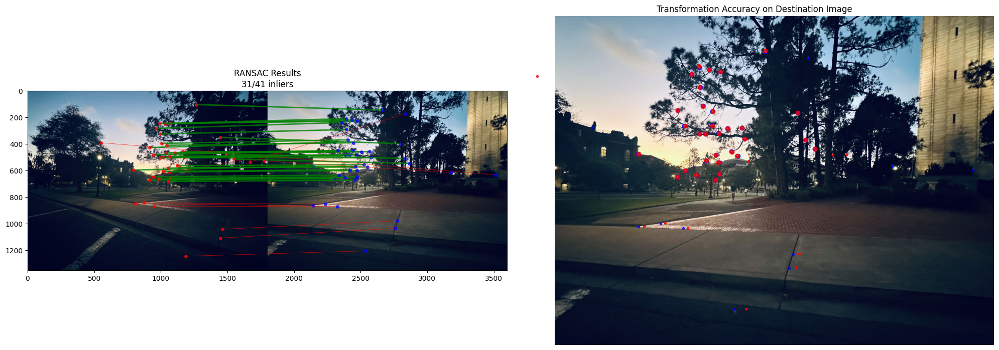

Inliers: 31/41
Average error: 1.50 pixels


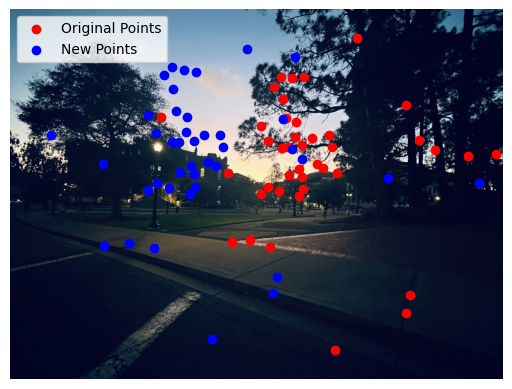

Original corners:
[[   0.    0.]
 [1799.    0.]
 [1799. 1349.]
 [   0. 1349.]]
Transformed corners:
[[-2079.15757114 -1109.14886127]
 [ 1214.73452962   182.71372382]
 [ 1200.08234474  1158.13447023]
 [-1864.04972741  2196.31045926]]
Bounding box: x[-2080, 1215], y[-1110, 2197]
min_pair would be: (-2080, -1110)


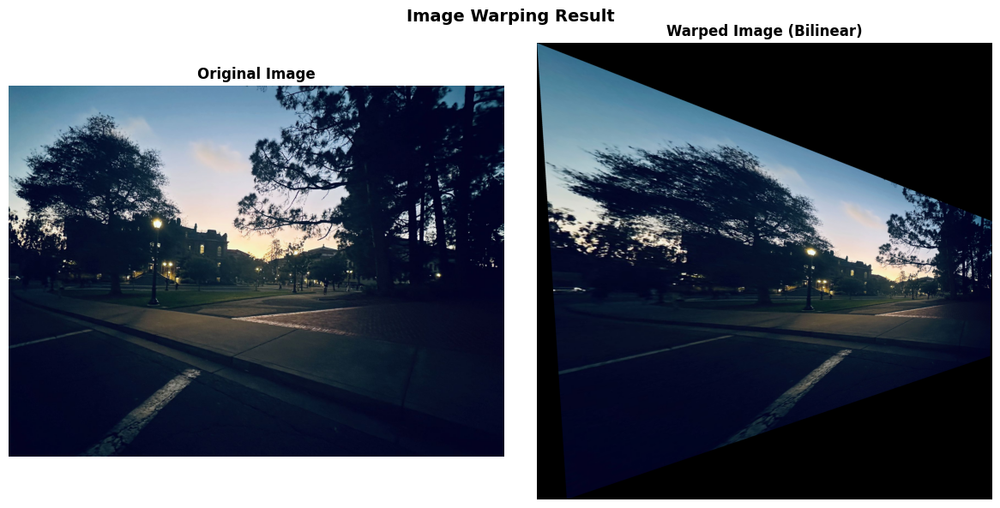

In [28]:
def visualize_ransac_corrected(img1, img2, src_pts, dst_pts, H, inlier_mask, title="RANSAC Results"):
    """
    CORRECTED: Proper coordinate handling throughout
    """
    # Convert from [y, x] to [x, y] format
    src_pts_xy = np.flipud(src_pts).T  # (N, 2) [x, y]
    dst_pts_xy = np.flipud(dst_pts).T  # (N, 2) [x, y]
    
    # Transform source points
    src_transformed = apply_homography(src_pts_xy, H)
    
    # Create composite image
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    composite = np.zeros((max(h1, h2), w1 + w2, 3))
    composite[:h1, :w1] = img1
    composite[:h2, w1:w1+w2] = img2
    
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))
    
    # Plot 1: Show matches with inliers/outliers
    axes[0].imshow(composite.astype(int))
    axes[0].set_title(f'{title}\n{np.sum(inlier_mask)}/{len(inlier_mask)} inliers')
    
    # Draw lines and points using [x, y] format
    for i in range(len(src_pts_xy)):
        x1, y1 = src_pts_xy[i]  # [x, y] from Image 1
        x2, y2 = dst_pts_xy[i]  # [x, y] from Image 2  
        x2 += w1  # Offset for second image
        
        color = 'green' if inlier_mask[i] else 'red'
        linewidth = 2 if inlier_mask[i] else 0.5
        
        axes[0].plot([x1, x2], [y1, y2], color=color, linewidth=linewidth, alpha=0.8)
        axes[0].plot(x1, y1, 'ro', markersize=4, alpha=0.7)
        axes[0].plot(x2, y2, 'bo', markersize=4, alpha=0.7)
    
    # Plot 2: Show transformation accuracy
    axes[1].imshow(img2)
    axes[1].set_title('Transformation Accuracy on Destination Image')
    
    for i in range(len(dst_pts_xy)):
        x_dst, y_dst = dst_pts_xy[i]  # [x, y]
        x_trans, y_trans = src_transformed[i]  # [x, y]
        
        color = 'green' if inlier_mask[i] else 'red'
        marker_size = 6 if inlier_mask[i] else 3
        
        axes[1].plot(x_dst, y_dst, 'bo', markersize=marker_size, alpha=0.8)
        axes[1].plot(x_trans, y_trans, 'ro', markersize=marker_size, alpha=0.8)
        
        if inlier_mask[i]:
            axes[1].plot([x_dst, x_trans], [y_dst, y_trans], 'y-', linewidth=1, alpha=0.5)
    
    axes[1].axis('off')
    plt.tight_layout()
    plt.show()
    
    # Print correct statistics
    errors = np.linalg.norm(src_transformed - dst_pts_xy, axis=1)
    print(f"Inliers: {np.sum(inlier_mask)}/{len(inlier_mask)}")
    print(f"Average error: {np.mean(errors[inlier_mask]):.2f} pixels")

# Use the corrected functions
H, num_inliers_corrected, error_corrected, inlier_mask_corrected = ransac_corrected(
    valid_coords1f, valid_coords2f, 
    num_iter=1000, inlier_threshold=5.0
)

visualize_ransac_corrected(
    img1, img2, 
    valid_coords1f, valid_coords2f, 
    H, inlier_mask_corrected,
    title="RANSAC Results"
)

#imwarped_nn = warpImageNearestNeighbor(img1, H)
#imwarped_bil = warpImageBilinear(img,H)

# Plot the image
fig, ax = plt.subplots()

# Plot the image
ax.imshow(img1)

# Plot the points on the image
ax.scatter(valid_coords1f[1, :], valid_coords1f[0, :], c='r', label='Original Points')
ax.scatter(valid_coords2f[1, :], valid_coords2f[0, :], c='b', label='New Points')

ax.legend()
ax.axis('off')
plt.show()

imwarped_nn = warpImageNearestNeighbor(img1, H)
#imwarped_bil = warpImageBilinear(img, H)

display(img1, imwarped_nn, "Bilinear")

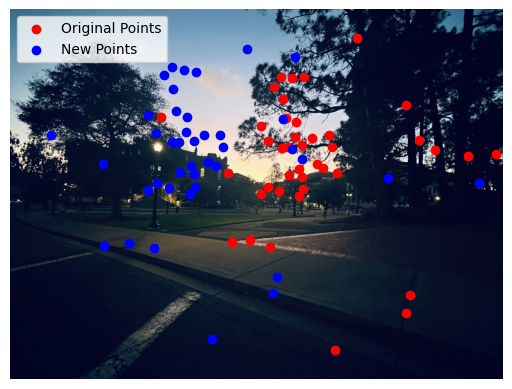

In [29]:

#imwarped_nn = warpImageNearestNeighbor(img1, H)
#imwarped_bil = warpImageBilinear(img,H)

# Plot the image
fig, ax = plt.subplots()

# Plot the image
ax.imshow(img1)

# Plot the points on the image
ax.scatter(valid_coords1f[1, :], valid_coords1f[0, :], c='r', label='Original Points')
ax.scatter(valid_coords2f[1, :], valid_coords2f[0, :], c='b', label='New Points')

ax.legend()
ax.axis('off')
plt.show()

Original corners:
[[   0.    0.]
 [1799.    0.]
 [1799. 1349.]
 [   0. 1349.]]
Transformed corners:
[[-2079.15757114 -1109.14886127]
 [ 1214.73452962   182.71372382]
 [ 1200.08234474  1158.13447023]
 [-1864.04972741  2196.31045926]]
Bounding box: x[-2080, 1215], y[-1110, 2197]
min_pair would be: (-2080, -1110)


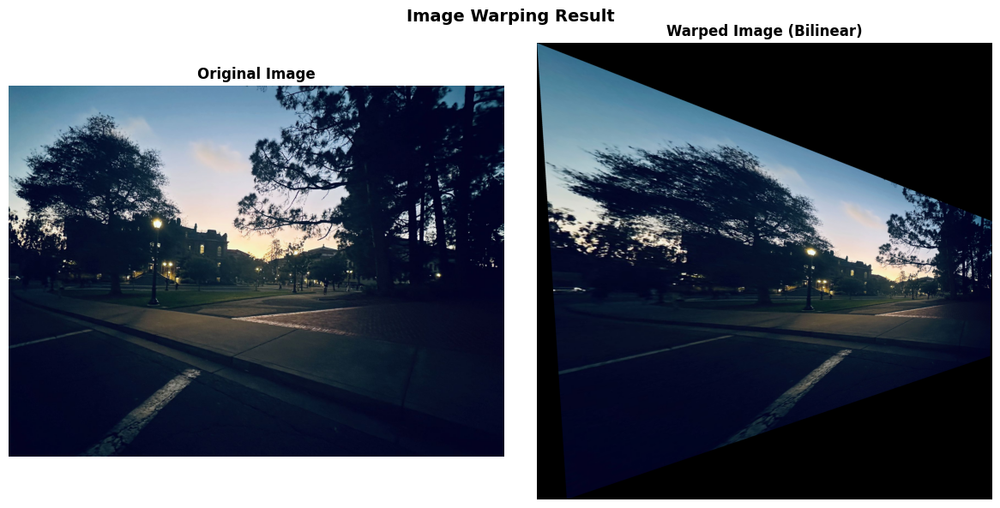

In [30]:

imwarped_nn = warpImageNearestNeighbor(img1, H)
#imwarped_bil = warpImageBilinear(img, H)

display(img1, imwarped_nn, "Bilinear")

Homography matrix:
[[ 3.50632412e+00  3.94500925e-02 -2.07915757e+03]
 [ 9.70099902e-01  2.59170148e+00 -1.10914886e+03]
 [ 1.37920412e-03  6.43798101e-05  1.00000000e+00]]
Original corners:
[[   0.    0.]
 [1799.    0.]
 [1799. 1349.]
 [   0. 1349.]]
Transformed corners:
[[-2079.15757114 -1109.14886127]
 [ 1214.73452962   182.71372382]
 [ 1200.08234474  1158.13447023]
 [-1864.04972741  2196.31045926]]
Bounding box: x[-2080, 1215], y[-1110, 2197]
min_pair would be: (-2080, -1110)
Output size: 3296 x 3308
This is 10,903,168 pixels!
Original corners:
[[   0.    0.]
 [1799.    0.]
 [1799. 1349.]
 [   0. 1349.]]
Transformed corners:
[[-2079.15757114 -1109.14886127]
 [ 1214.73452962   182.71372382]
 [ 1200.08234474  1158.13447023]
 [-1864.04972741  2196.31045926]]
Bounding box: x[-2080, 1215], y[-1110, 2197]
min_pair would be: (-2080, -1110)


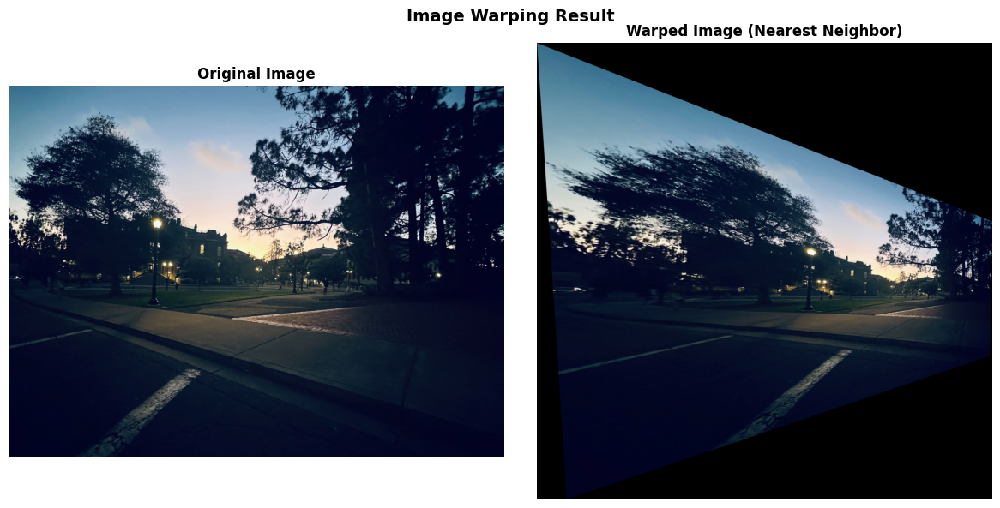

In [31]:
print(f"Homography matrix:\n{H}")
output_w, output_h, min_pair = get_output_size(img1, H)
print(f"Output size: {output_w} x {output_h}")
print(f"This is {output_w * output_h:,} pixels!")

imwarped_nn = warpImageNearestNeighbor(img1,H)
#imwarped_bil = warpImageBilinear(img, H)


display(img1, imwarped_nn, "Nearest Neighbor")

#display(img, imwarped_bil, "Bilinear")


A.4: Blend the Images into a Mosaic

In [32]:
from scipy import ndimage

def create_distance_weights(mask):
    if not np.any(mask):
        return np.zeros_like(mask, dtype=np.float32)
    
    dist_transform = ndimage.distance_transform_edt(mask)
    
    if np.max(dist_transform) > 0:
        weights = dist_transform / np.max(dist_transform)
    else:
        weights = mask.astype(np.float32)
    
    return weights

In [33]:
def compose_mosaic_proper_blending(img1, img2, H2, interp_func):
 
    h2, w2 = img2.shape[:2]
    corners2 = np.array([[0, 0, 1], [w2-1, 0, 1], [w2-1, h2-1, 1], [0, h2-1, 1]], dtype=np.float32)
    transformed_corners2 = corners2 @ H2.T
    transformed_corners2 = transformed_corners2[:, :2] / transformed_corners2[:, 2:3]

    h1, w1 = img1.shape[:2]
    corners1 = np.array([[0, 0], [w1-1, 0], [w1-1, h1-1], [0, h1-1]], dtype=np.float32)

    all_corners = np.vstack([corners1, transformed_corners2])
    min_x, min_y = np.floor(np.min(all_corners, axis=0)).astype(int)
    max_x, max_y = np.ceil(np.max(all_corners, axis=0)).astype(int)
    mosaic_width = max_x - min_x + 1
    mosaic_height = max_y - min_y + 1

    print(f"Mosaic size: {mosaic_width} x {mosaic_height}")

    T = np.array([[1, 0, -min_x],
                  [0, 1, -min_y],
                  [0, 0, 1]])

    H2_adjusted = T @ H2

    warped_img2 = warpImage(img2, H2_adjusted, interp_func)
    print(f"Warped image size: {warped_img2.shape}")

    offset_x, offset_y = -min_x, -min_y
    
    canvas = np.zeros((mosaic_height, mosaic_width, 4), dtype=np.uint8)
    weight_map = np.zeros((mosaic_height, mosaic_width), dtype=np.float32)
    color_sum = np.zeros((mosaic_height, mosaic_width, 3), dtype=np.float32)
    
    # Place img1
    y1_start, y1_end = offset_y, offset_y + h1
    x1_start, x1_end = offset_x, offset_x + w1
    
    # Simple weights for img1 (all 1.0 for now)
    img1_weights = np.ones((h1, w1), dtype=np.float32)
    
    for c in range(3):
        color_sum[y1_start:y1_end, x1_start:x1_end, c] += (
            img1[:, :, c].astype(np.float32) * img1_weights
        )
    weight_map[y1_start:y1_end, x1_start:x1_end] += img1_weights
    canvas[y1_start:y1_end, x1_start:x1_end, 3] = 255
    
    h_warped, w_warped = warped_img2.shape[:2]
    warped_region = warped_img2[:h_warped, :w_warped]
    warped_mask = warped_region[:, :, 3] > 0
    
    if np.any(warped_mask):
        warped_weights = warped_mask.astype(np.float32)
        
        for c in range(3):
            color_sum[:h_warped, :w_warped, c] += (
                warped_region[:, :, c].astype(np.float32) * warped_weights
            )
        weight_map[:h_warped, :w_warped] += warped_weights
        canvas[:h_warped, :w_warped, 3] = np.maximum(
            canvas[:h_warped, :w_warped, 3], 
            warped_region[:, :, 3]
        )
    
    valid_weights = weight_map > 0
    for c in range(3):
        canvas[:, :, c][valid_weights] = np.clip(
            color_sum[:, :, c][valid_weights] / weight_map[valid_weights], 
            0, 255
        ).astype(np.uint8)

    # Auto-crop 
    alpha_channel = canvas[:, :, 3]
    rows = np.any(alpha_channel > 0, axis=1)
    cols = np.any(alpha_channel > 0, axis=0)
    
    if np.any(rows) and np.any(cols):
        ymin, ymax = np.where(rows)[0][[0, -1]]
        xmin, xmax = np.where(cols)[0][[0, -1]]
        
        pad = 10
        ymin = max(0, ymin - pad)
        ymax = min(mosaic_height-1, ymax + pad)
        xmin = max(0, xmin - pad)
        xmax = min(mosaic_width-1, xmax + pad)
        
        cropped_canvas = canvas[ymin:ymax+1, xmin:xmax+1]
        print(f"Cropped from {mosaic_width}x{mosaic_height} to {cropped_canvas.shape[1]}x{cropped_canvas.shape[0]}")
    else:
        cropped_canvas = canvas
        print("No cropping applied")

    return cropped_canvas

In [34]:
def warpImage(im, H, interp_func):  ##warpImage with no offset, easier for world coord 
    output_w, output_h, min_pair = get_output_size(im, H)

    if len(im.shape) == 3:
        output = np.zeros((output_h, output_w, 4), dtype=im.dtype)  # RGBA
    else:
        output = np.zeros((output_h, output_w, 2), dtype=im.dtype)

    #assign point coord values 
    y_out, x_out = np.mgrid[0:output_h, 0:output_w]
    

    coords_out = np.stack([x_out, y_out, np.ones_like(x_out)], axis=-1)

    H_inv = np.linalg.inv(H)
    coords_src = (coords_out @ H_inv.T)
    coords_src = coords_src[:, :, :2]/coords_src[:,:,2:3]

    x_src = coords_src[:, :, 0]
    y_src = coords_src[:, :, 1]

    h_src, w_src = im.shape[:2]
    mask = (x_src >= 0) & (x_src <= w_src-1) & (y_src >= 0) & (y_src <= h_src-1)

    if len(im.shape) == 3: 
        for c in range(3): 
            output[:,:,c] = interp_func(im[:,:,c], x_src, y_src)
            output[:,:,c] = output[:,:,c] * mask
        output[:, :, 3] = (mask * 255).astype(im.dtype)  #transparent = 0 
    else: 
        output[:, :, 0] = interp_func(im[:,:,0], x_src, y_src)
        output[:, :, 1] = (mask * 255).astype(im.dtype) 
        
    return output 

def warpImageNearestNeighbor(im, H): 
    return warpImage(im, H, nearest_neighbor_interp)
def warpImageBilinear(im, H):
    return warpImage(im, H, bilinear_interp)

In [35]:
def get_H(json_path): 
    with open(json_path, 'r') as f:
        warped_points = json.load(f)

    original_pts = np.array(warped_points["im1Points"])
    new_pts = np.array(warped_points["im2Points"])


    H = computeH(original_pts,new_pts)
    return H, original_pts, new_pts

In [37]:
img1 = plt.imread("../data/IMG_8862r.jpg")
img2 = plt.imread("../data/IMG_8863r.jpg")

img_gray1 = rgb2gray(img1)
h1, coord1 = harris.get_harris_corners(img_gray1)
h_array1 =  h1[coord1[0, :].astype(int), coord1[1, :].astype(int)] 

img_gray2 = rgb2gray(img2)
h2, coord2 = harris.get_harris_corners(img_gray2)
h_array2 =  h2[coord2[0, :].astype(int), coord2[1, :].astype(int)] 

coord_anms1, r_value1= anms(h_array1, coord1, 100)
descriptors1, valid_coords1 = extract_descirptor(img_gray1, coord_anms1)

coord_anms2, r_value2= anms(h_array2, coord2, 100)
descriptors2, valid_coords2 = extract_descirptor(img_gray2, coord_anms2)

# img1 = plt.imread('../data/IMG_8863r.jpg') 
# img2 = plt.imread('../data/IMG_8862r.jpg') 
valid_coords1f, valid_coords2f, descriptors1f, descriptors2f,= feature_matching(
    descriptors1, valid_coords1, 
    descriptors2, valid_coords2, 
    threshold=0.7
)

H, num_inliers_corrected, error_corrected, inlier_mask_corrected = ransac(
    valid_coords1f, valid_coords2f, 
    num_iter=1000, inlier_threshold=5.0
)

mosaic = compose_mosaic_proper_blending(img2, img1, H, nearest_neighbor_interp)


n:985
[[ 133 1190]]
[[181 350]]
[[582 700]]
[[ 458 1196]]
[[329 535]]
[[ 332 1530]]
[[586 659]]
[[ 303 1239]]
[[ 739 1244]]
[[275  96]]
[[ 470 1673]]
[[ 596 1733]]
[[494 246]]
[[526 413]]
[[ 129 1051]]
[[ 708 1075]]
[[340  43]]
[[312 244]]
[[ 410 1224]]
[[ 529 1167]]
[[656 764]]
[[ 318 1634]]
[[  66 1010]]
[[709 904]]
[[ 356 1690]]
[[ 252 1224]]
[[ 335 1166]]
[[151 317]]
[[ 411 1143]]
[[357 119]]
[[  35 1019]]
[[ 291 1523]]
[[235 467]]
[[ 395 1516]]
[[ 259 1545]]
[[ 695 1561]]
[[ 332 1560]]
[[ 720 1050]]
[[  84 1134]]
[[207 938]]
[[154 378]]
[[177 198]]
[[848 810]]
[[  26 1065]]
[[325 294]]
[[598 830]]
[[119 305]]
[[177 234]]
[[  51 1461]]
[[ 396 1682]]
[[  91 1040]]
[[867 951]]
[[ 369 1720]]
[[317 319]]
[[658 577]]
[[ 116 1139]]
[[ 731 1278]]
[[  73 1223]]
[[  70 1295]]
[[ 227 1493]]
[[ 454 1358]]
[[ 422 1006]]
[[  98 1219]]
[[ 746 1045]]
[[  65 1058]]
[[ 372 1532]]
[[ 720 1455]]
[[ 186 1648]]
[[ 298 1770]]
[[842 875]]
[[279 883]]
[[699 825]]
[[ 162 1594]]
[[ 195 1592]]
[[ 235 1631]]


ValueError: At least 4 point correspondences are required

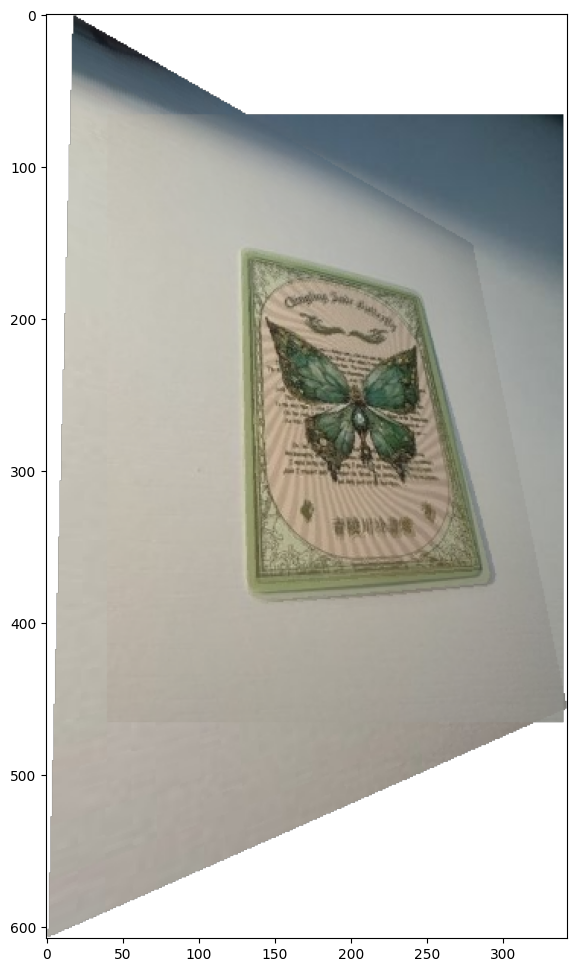

In [ ]:

fig, axes = plt.subplots(figsize=(18, 12))
plt.imshow(mosaic)
plt.show()

In [39]:
import numpy as np
from scipy import ndimage
import matplotlib.pyplot as plt

def create_blending_mask(warped_img, reference_img):
    
    mask_warped = np.any(warped_img > 0, axis=2).astype(np.uint8)
    mask_reference = np.any(reference_img > 0, axis=2).astype(np.uint8)
    
    dist_warped = ndimage.distance_transform_edt(mask_warped)
    dist_reference = ndimage.distance_transform_edt(mask_reference)
    
    alpha_mask = np.zeros_like(dist_warped, dtype=np.float32)
    
    overlap_mask = (mask_warped > 0) & (mask_reference > 0)
    if np.any(overlap_mask):
        total_dist = dist_warped[overlap_mask] + dist_reference[overlap_mask]
        alpha_mask[overlap_mask] = dist_warped[overlap_mask] / total_dist
    
    warped_only = (mask_warped > 0) & (mask_reference == 0)
    alpha_mask[warped_only] = 1.0
    
    
    return alpha_mask

def blend_images_weighted(img1, img2, alpha_mask):
   
    if len(alpha_mask.shape) == 2:
        alpha_mask = alpha_mask[:, :, np.newaxis]
    
    img1_float = img1.astype(np.float32)
    img2_float = img2.astype(np.float32)
    
    blended = img1_float * alpha_mask + img2_float * (1.0 - alpha_mask)
    
    return np.clip(blended, 0, 255).astype(np.uint8)

def compose_mosaic_distance_blend(img1, img2, H, interp_func):
    
    
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    
    corners1 = np.array([[0, 0, 1], [w1-1, 0, 1], [w1-1, h1-1, 1], [0, h1-1, 1]], dtype=np.float32)
    corners2 = np.array([[0, 0, 1], [w2-1, 0, 1], [w2-1, h2-1, 1], [0, h2-1, 1]], dtype=np.float32)
    
    transformed_corners2 = (H @ corners2.T).T
    transformed_corners2 = transformed_corners2[:, :2] / transformed_corners2[:, 2:3]
    
    all_corners = np.vstack([corners1[:, :2], transformed_corners2])
    
    min_x, min_y = np.floor(np.min(all_corners, axis=0)).astype(int)
    max_x, max_y = np.ceil(np.max(all_corners, axis=0)).astype(int)
    
    mosaic_width = max_x - min_x + 1
    mosaic_height = max_y - min_y + 1
    
    print(f"Mosaic size: {mosaic_width} x {mosaic_height}")

    T = np.array([[1, 0, -min_x],
                  [0, 1, -min_y],
                  [0, 0, 1]])
    H_adjusted = T @ H

    warped_img2 = warpImage(img2, H_adjusted, interp_func)
    print(f"Warped image size: {warped_img2.shape}")

    canvas = np.zeros((mosaic_height, mosaic_width, 3), dtype=np.uint8)
    
    offset_x, offset_y = -min_x, -min_y
    y1_start, y1_end = offset_y, offset_y + h1
    x1_start, x1_end = offset_x, offset_x + w1
    canvas[y1_start:y1_end, x1_start:x1_end] = img1

    h_warped, w_warped = warped_img2.shape[:2]
    warped_rgb = warped_img2[:, :, :3]  
    
    canvas_region = canvas[:h_warped, :w_warped]
    
    alpha_mask = create_blending_mask(warped_rgb, canvas_region)
    
    blended_region = blend_images_weighted(warped_rgb, canvas_region, alpha_mask)
    
    canvas[:h_warped, :w_warped] = blended_region

    non_empty_mask = np.any(canvas > 0, axis=2)
    rows = np.any(non_empty_mask, axis=1)
    cols = np.any(non_empty_mask, axis=0)
    
    if np.any(rows) and np.any(cols):
        ymin, ymax = np.where(rows)[0][[0, -1]]
        xmin, xmax = np.where(cols)[0][[0, -1]]
        
        pad = 10
        ymin = max(0, ymin - pad)
        ymax = min(mosaic_height-1, ymax + pad)
        xmin = max(0, xmin - pad)
        xmax = min(mosaic_width-1, xmax + pad)
        
        canvas = canvas[ymin:ymax+1, xmin:xmax+1]
        print(f"Cropped to: {canvas.shape[1]} x {canvas.shape[0]}")

    return canvas


n:985
[[ 133 1190]]
[[181 350]]
[[582 700]]
[[ 458 1196]]
[[329 535]]
[[ 332 1530]]
[[586 659]]
[[ 303 1239]]
[[ 739 1244]]
[[275  96]]
[[ 470 1673]]
[[ 596 1733]]
[[494 246]]
[[526 413]]
[[ 129 1051]]
[[ 708 1075]]
[[340  43]]
[[312 244]]
[[ 410 1224]]
[[ 529 1167]]
[[656 764]]
[[ 318 1634]]
[[  66 1010]]
[[709 904]]
[[ 356 1690]]
[[ 252 1224]]
[[ 335 1166]]
[[151 317]]
[[ 411 1143]]
[[357 119]]
[[  35 1019]]
[[ 291 1523]]
[[235 467]]
[[ 395 1516]]
[[ 259 1545]]
[[ 695 1561]]
[[ 332 1560]]
[[ 720 1050]]
[[  84 1134]]
[[207 938]]
[[154 378]]
[[177 198]]
[[848 810]]
[[  26 1065]]
[[325 294]]
[[598 830]]
[[119 305]]
[[177 234]]
[[  51 1461]]
[[ 396 1682]]
[[  91 1040]]
[[867 951]]
[[ 369 1720]]
[[317 319]]
[[658 577]]
[[ 116 1139]]
[[ 731 1278]]
[[  73 1223]]
[[  70 1295]]
[[ 227 1493]]
[[ 454 1358]]
[[ 422 1006]]
[[  98 1219]]
[[ 746 1045]]
[[  65 1058]]
[[ 372 1532]]
[[ 720 1455]]
[[ 186 1648]]
[[ 298 1770]]
[[842 875]]
[[279 883]]
[[699 825]]
[[ 162 1594]]
[[ 195 1592]]
[[ 235 1631]]


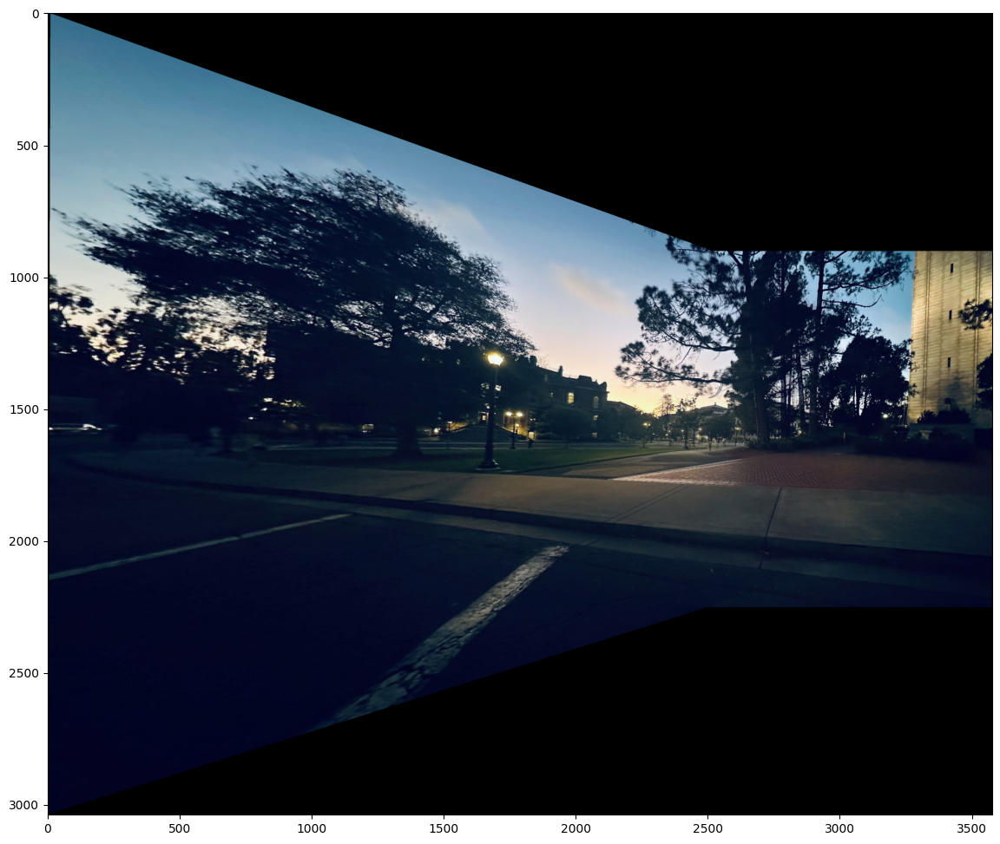

In [40]:
img1 = plt.imread("../data/IMG_8862r.jpg")
img2 = plt.imread("../data/IMG_8863r.jpg")

img_gray1 = rgb2gray(img1)
h1, coord1 = harris.get_harris_corners(img_gray1)
h_array1 =  h1[coord1[0, :].astype(int), coord1[1, :].astype(int)] 

img_gray2 = rgb2gray(img2)
h2, coord2 = harris.get_harris_corners(img_gray2)
h_array2 =  h2[coord2[0, :].astype(int), coord2[1, :].astype(int)] 

coord_anms1, r_value1= anms(h_array1, coord1, 100)
descriptors1, valid_coords1 = extract_descirptor(img_gray1, coord_anms1)

coord_anms2, r_value2= anms(h_array2, coord2, 100)
descriptors2, valid_coords2 = extract_descirptor(img_gray2, coord_anms2)

# img1 = plt.imread('../data/IMG_8863r.jpg') 
# img2 = plt.imread('../data/IMG_8862r.jpg') 
valid_coords1f, valid_coords2f, descriptors1f, descriptors2f,= feature_matching(
    descriptors1, valid_coords1, 
    descriptors2, valid_coords2, 
    threshold=0.7
)

H, num_inliers_corrected, error_corrected, inlier_mask_corrected = ransac_corrected(
    valid_coords1f, valid_coords2f, 
    num_iter=1000, inlier_threshold=10.0
)
mosaic = compose_mosaic_distance_blend(img2, img1, H, nearest_neighbor_interp)

#mosaic = compose_mosaic_distance_blend(img2, img1, H, bilinear_interp)
fig, axes = plt.subplots(figsize=(18, 12))
plt.imshow(mosaic)
plt.show()